In [1]:

# imports
import os
import sys
import types
import json

# figure size/format
fig_width = 7
fig_height = 5
fig_format = 'retina'
fig_dpi = 96

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = fig_dpi
  from IPython.display import set_matplotlib_formats
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  pio.renderers.default = "notebook_connected"
except Exception:
  pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass



# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
if r'/Users/jared/Library/Group Containers/UBF8T346G9.OneDriveStandaloneSuite/OneDrive.noindex/OneDrive/Documents/University stuff/Masters Year/DS4I/Assignment1/project':
  os.chdir(r'/Users/jared/Library/Group Containers/UBF8T346G9.OneDriveStandaloneSuite/OneDrive.noindex/OneDrive/Documents/University stuff/Masters Year/DS4I/Assignment1/project')

# reset state
%reset

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v
  
  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define


/var/folders/v7/l0jq1cbd0fnf4ytmwzksxt0r0000gn/T/ipykernel_45538/2880052412.py:20: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats(fig_format)


{"/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/importlib/_bootstrap.py": 1687560475.899881, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/importlib/_bootstrap_external.py": 1687560475.905339, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/codecs.py": 1687560473.470777, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/encodings/aliases.py": 1687560474.989399, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/encodings/__init__.py": 1687560474.985129, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/encodings/utf_8.py": 1687560475.43757, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/abc.py": 1687560473.346976, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/io.py": 1687560473.627098, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/stat.py": 1687560473.825673, "/Users/jared/opt/anaconda3/envs/scientificProject/lib/python3.10/_

In [2]:
# Loading in the necessary libraries
import zipfile
import os
import pandas as pd
import re
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from itertools import cycle
import seaborn as sns
import numpy as np
from collections import Counter
from nltk.tokenize import word_tokenize

In [3]:
# Unzip the file and get the list of filenames
with zipfile.ZipFile("data/speeches.zip", 'r') as zip_ref:
    zip_ref.extractall("data")

filenames = os.listdir("data")
filenames = [filename for filename in filenames if filename.endswith('.txt')]

# Read the content of each speech file and extract the date from the first line
speeches = []
dates = []
for filename in filenames:
    with open(os.path.join("data", filename), 'r', encoding='utf-8') as file:
        # Extract date from the first line
        date = file.readline().strip()
        dates.append(date)
        
        # Read the rest of the file
        speeches.append(file.read())

# Create DataFrame
sona = pd.DataFrame({'filename': filenames, 'speech': speeches, 'date': dates})

# Extract year and president for each speech
sona['year'] = sona['filename'].str[:4]
sona['president'] = sona['filename'].str.split('_').str[-1].str.split('.').str[0]

# Clean the sona dataset by removing unnecessary text
replace_reg = r'(http.*?(\s|.$))|(www.*?(\s|.$))|&amp;|&lt;|&gt;|\n'
sona['speech'] = sona['speech'].str.replace(replace_reg, ' ')

# Split speeches into sentences
sona_sentences = sona['speech'].str.split(r'(?<!\w\.\w.)(?<![A-Z][a-z]\.)(?<=\.|\?)\s', expand=True).stack().reset_index(level=-1, drop=True)
sona_sentences.name = 'sentence'

# Remove newline characters from the sentences
sona_sentences = sona_sentences.str.replace('\n', '').str.strip()

# Merge with the president, date, and year columns to associate each sentence with the respective details
df_sentences = sona[['president', 'date', 'year']].join(sona_sentences)

# Make a csv of the sentences
df_sentences.to_csv('data/sentences.csv', index=False)

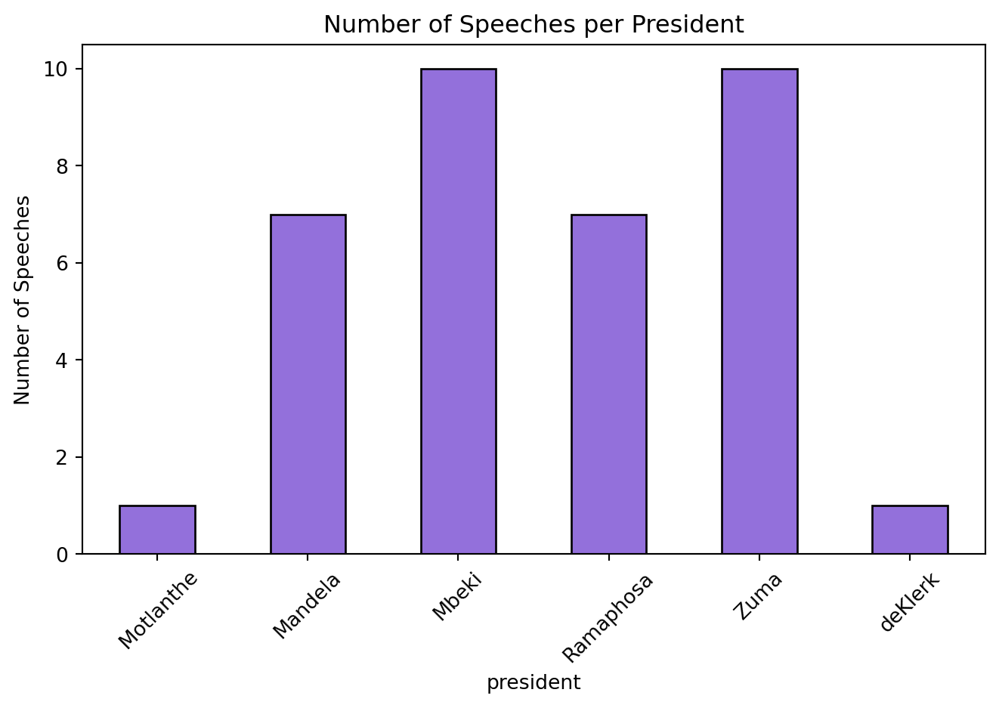

In [4]:
speeches_per_president = sona.groupby('president').size().reset_index(name='number_of_speeches')

# Display the table for number of speeches per president in a well-formatted manner
speeches_per_president.set_index('president', inplace=True)

# Plot the number of speeches per president
plt.figure()
speeches_per_president.plot(kind='bar', legend=False, color='mediumpurple', edgecolor='black', ax=plt.gca())
plt.title('Number of Speeches per President')
plt.ylabel('Number of Speeches')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


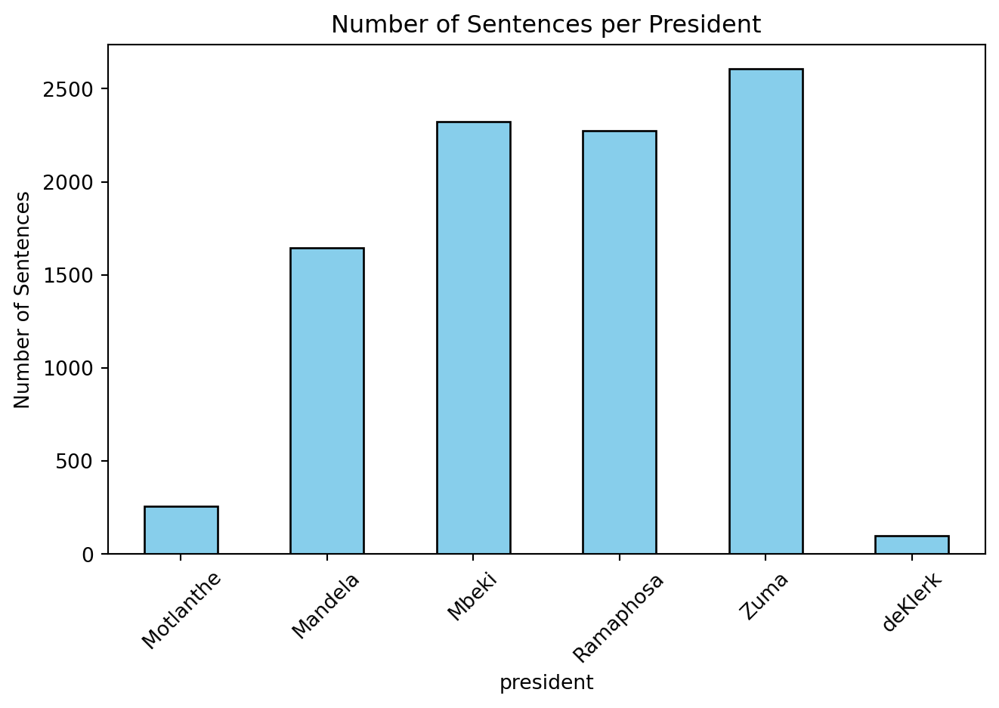

In [5]:
sentences_per_president = df_sentences.groupby('president').size().reset_index(name='number_of_sentences')
#plt.figure()
sentences_per_president.plot(x='president', y='number_of_sentences', kind='bar', legend=False, color='skyblue', edgecolor='black')
plt.title('Number of Sentences per President')
plt.ylabel('Number of Sentences')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<Figure size 672x480 with 0 Axes>

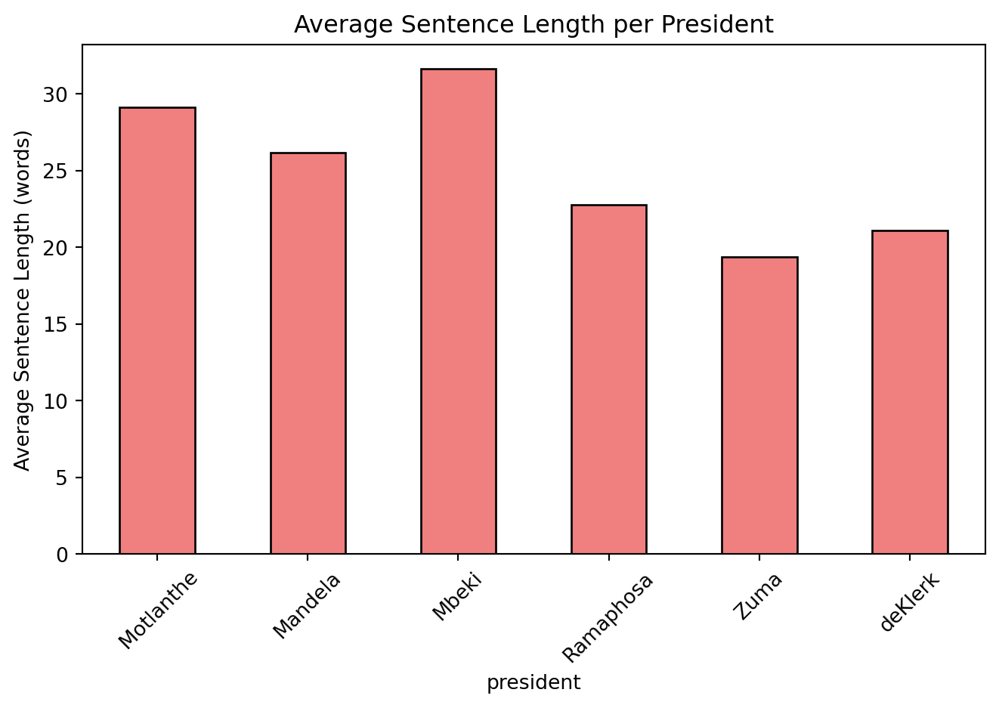

In [6]:
df_sentences['sentence_length'] = df_sentences['sentence'].str.split().str.len()
avg_sentence_length = df_sentences.groupby('president')['sentence_length'].mean().reset_index()

plt.figure()
avg_sentence_length.plot(x='president', y='sentence_length', kind='bar', legend=False, color='lightcoral', edgecolor='black')
plt.title('Average Sentence Length per President')
plt.ylabel('Average Sentence Length (words)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


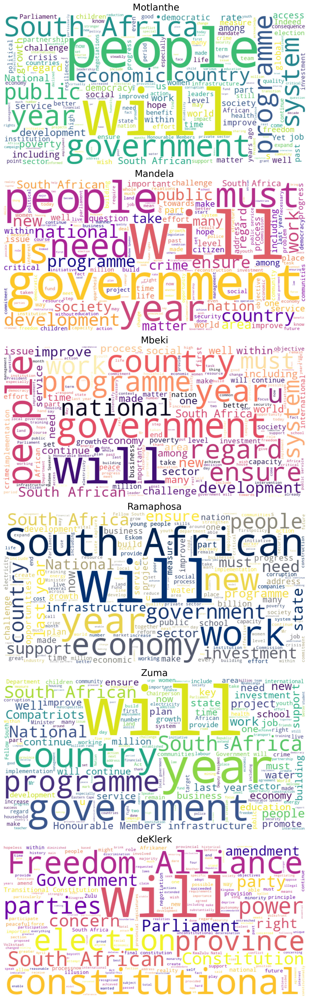

In [7]:
from itertools import cycle
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Set the stopwords
stopwords = set(STOPWORDS)

# Selected colormaps
colormaps = cycle(['viridis', 'plasma', 'magma', 'cividis'])

# Adjusting the layout for the word clouds
plt.figure(figsize=(15, 30))

# Generate a word cloud for each president, with adjusted layout
for idx, (president, group) in enumerate(df_sentences.groupby('president')):
    text = ' '.join(group['sentence'])
    wc = WordCloud(stopwords=stopwords, background_color='white', colormap=next(colormaps), max_words=200, width=800, height=400).generate(text)
    
    # Display the word cloud
    plt.subplot(len(df_sentences['president'].unique()), 1, idx + 1)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(president, fontdict={'fontsize': 20, 'fontweight': 'medium'})

plt.tight_layout()
plt.show()


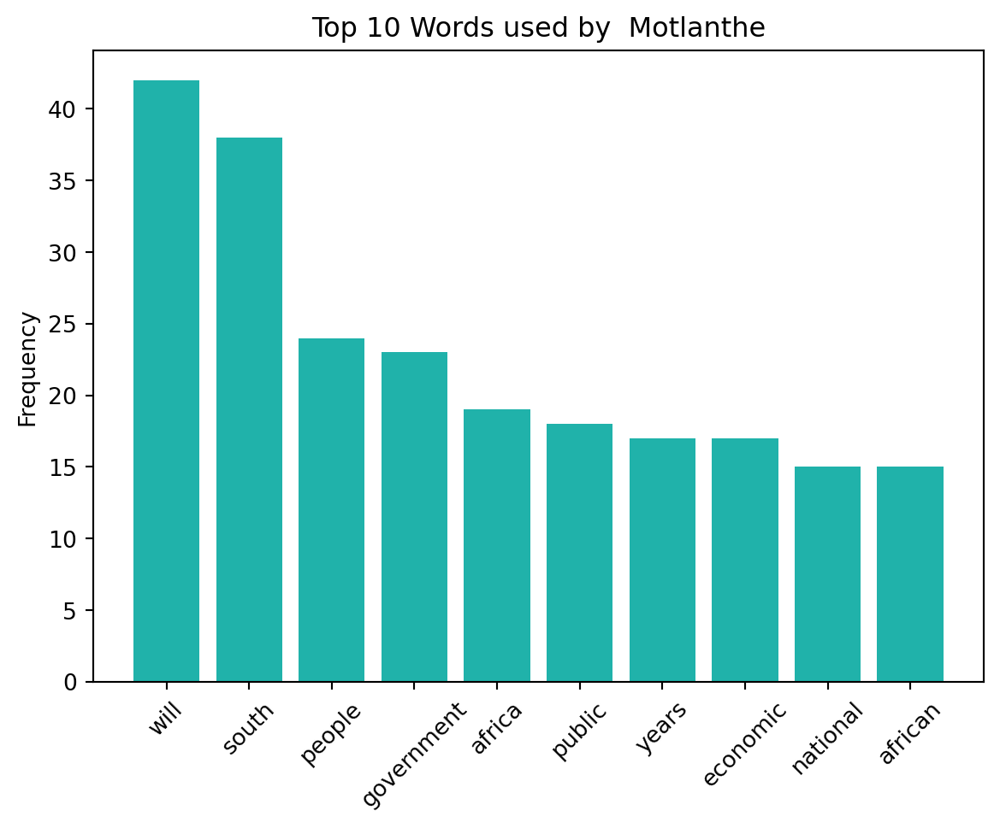

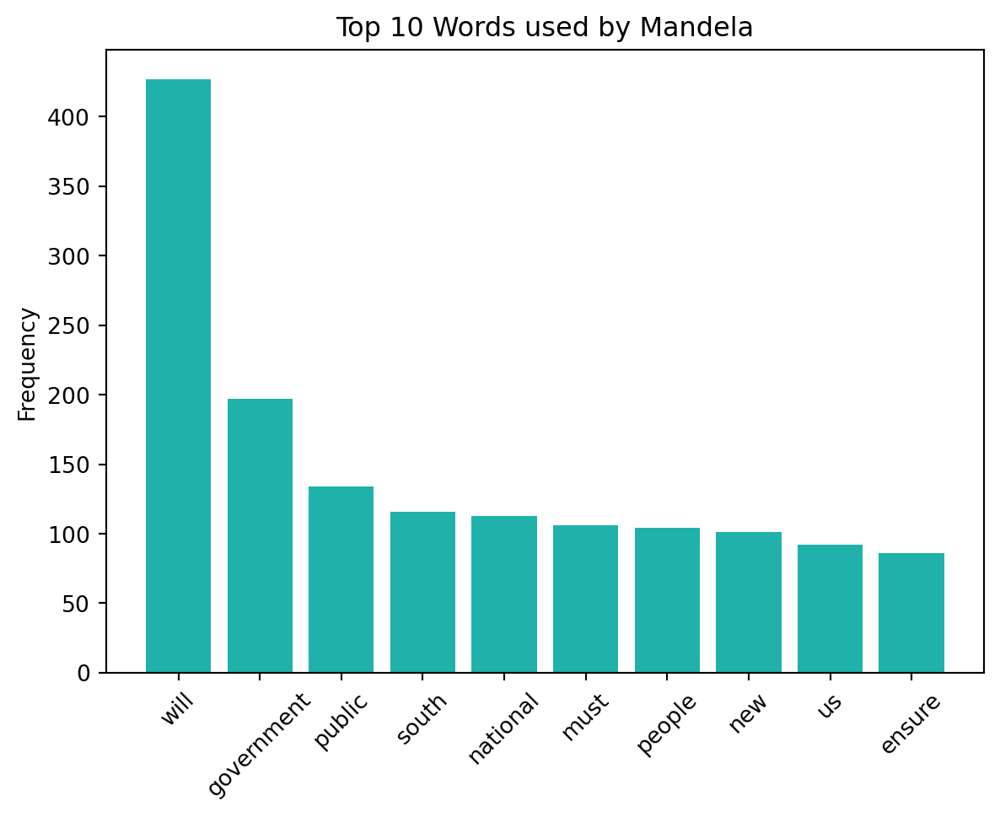

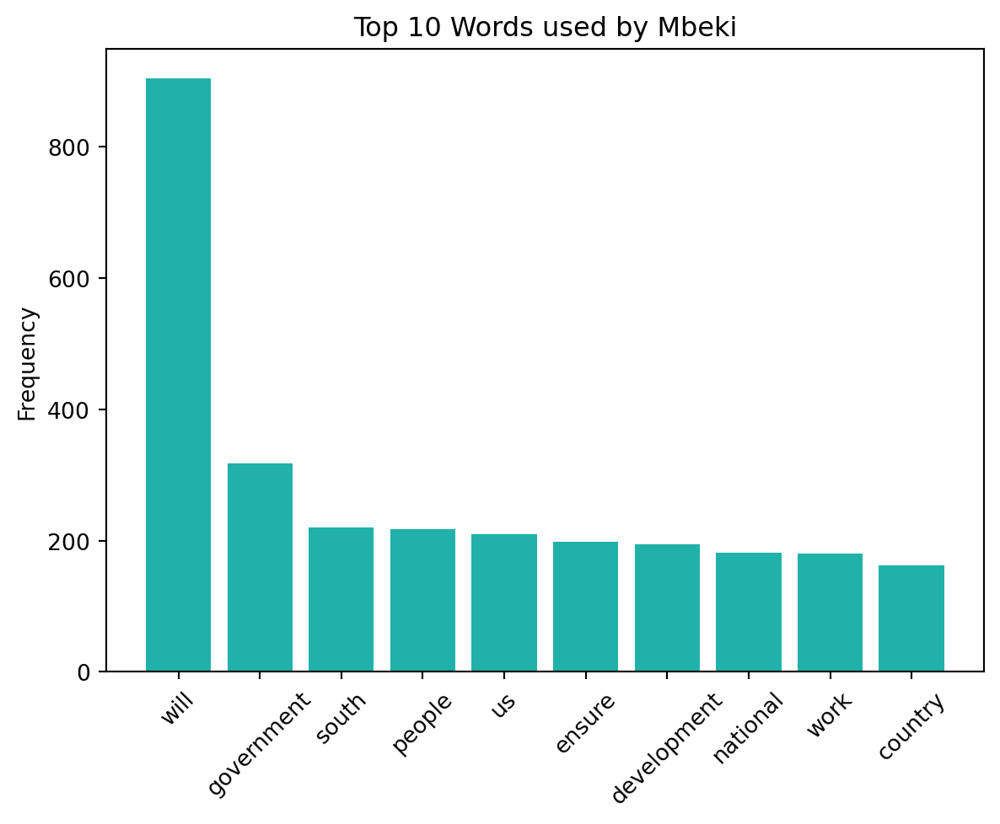

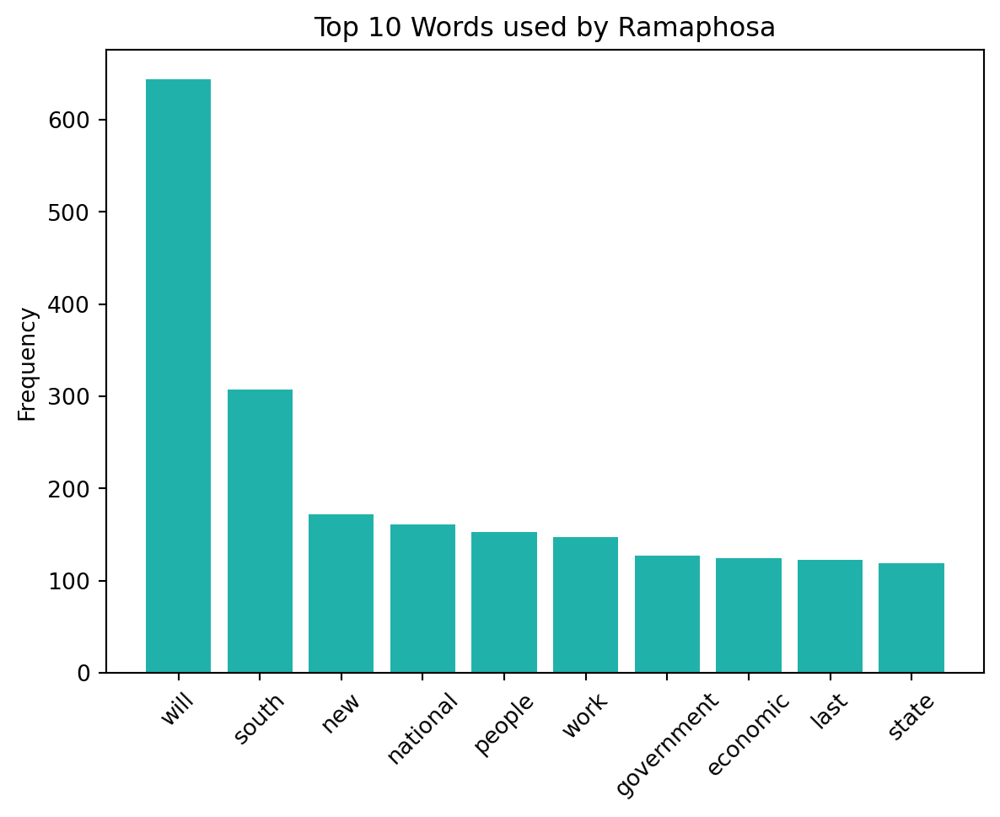

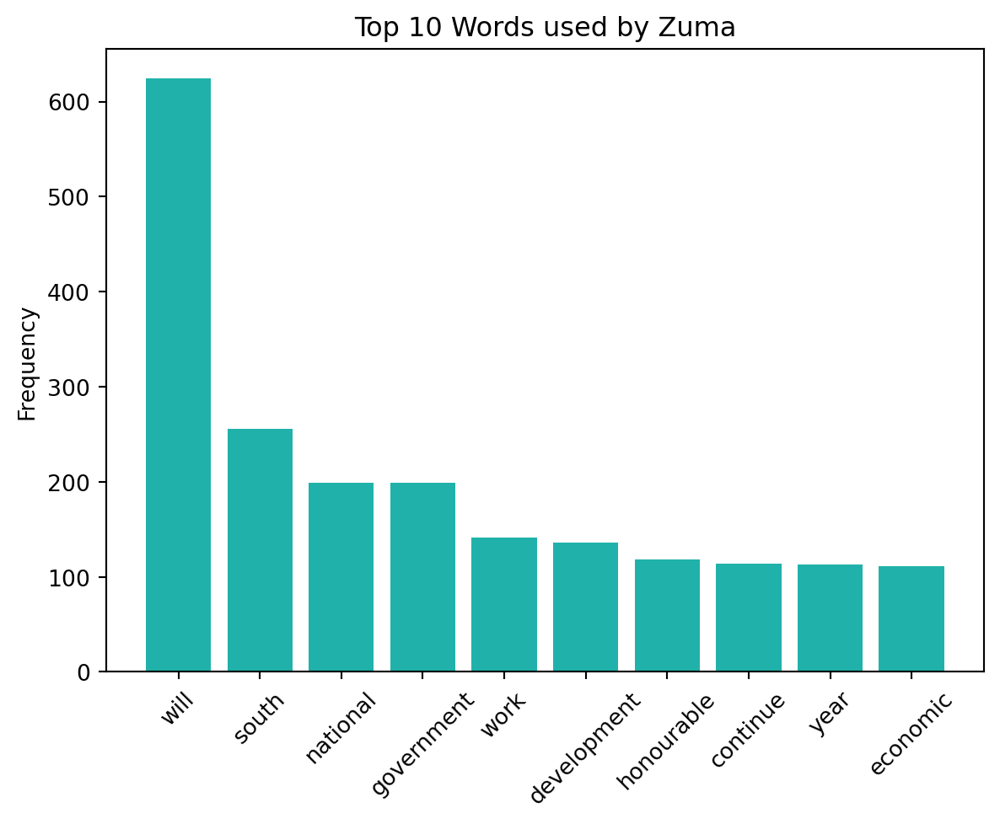

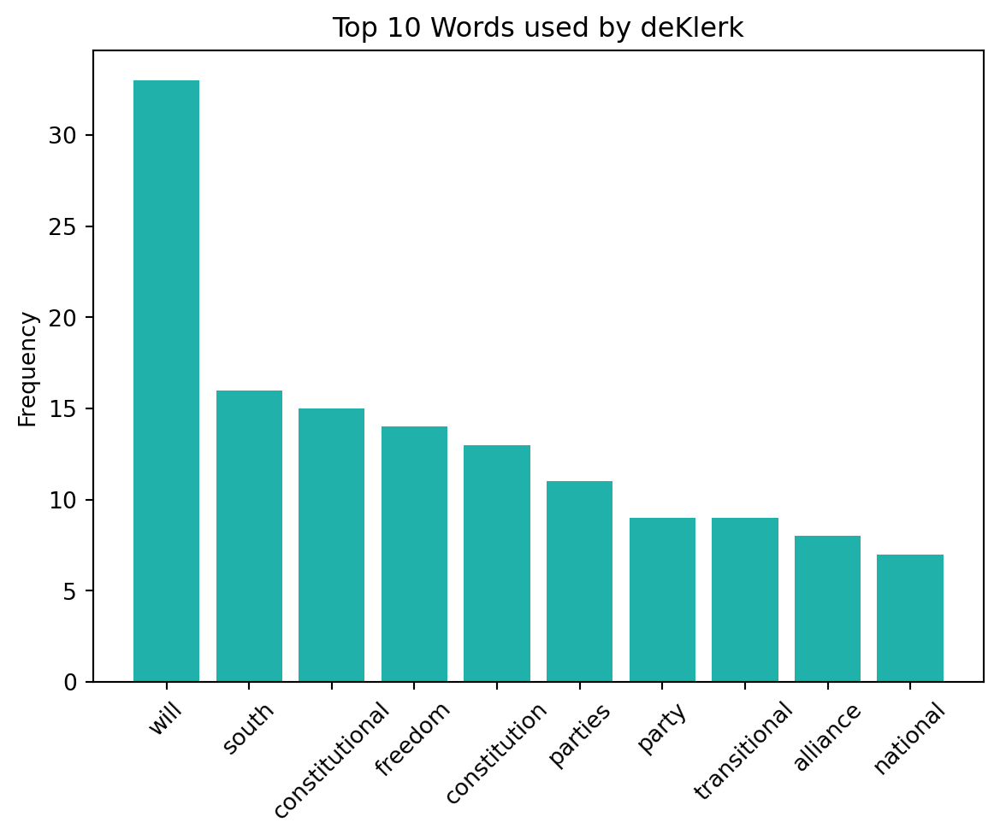

In [8]:
# Define a simple tokenizer function
def simple_tokenize(text):
    return [word for word in text.split() if word.isalpha()]

# Update the plotting function to use the simple tokenizer
def plot_word_frequency(text, president_name, n=10):
    tokens = simple_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word not in stopwords]
    frequency = Counter(filtered_tokens)
    most_common = frequency.most_common(n)
    
    words, counts = zip(*most_common)
    plt.bar(words, counts, color='lightseagreen')
    plt.title(f"Top {n} Words used by {president_name}")
    plt.xticks(rotation=45)
    plt.ylabel("Frequency")
    plt.show()

# Plot word frequency distribution for each president using the updated function
for president, group in df_sentences.groupby('president'):
    plot_word_frequency(' '.join(group['sentence']), president)


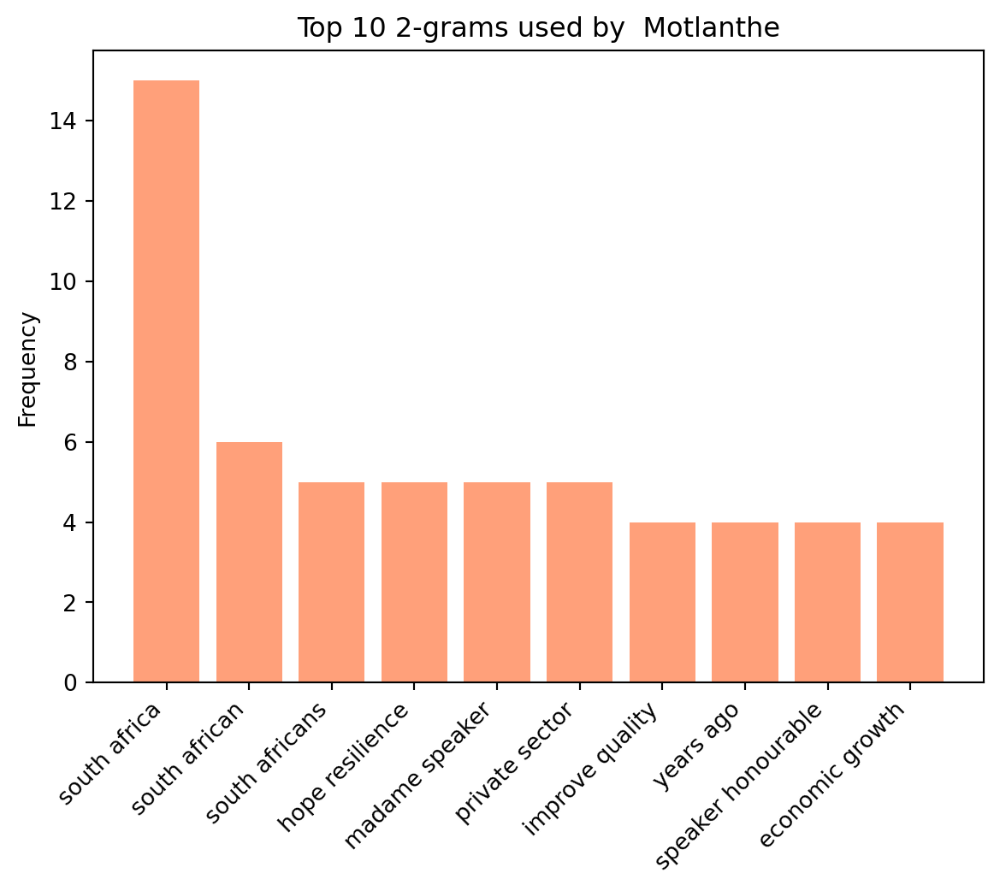

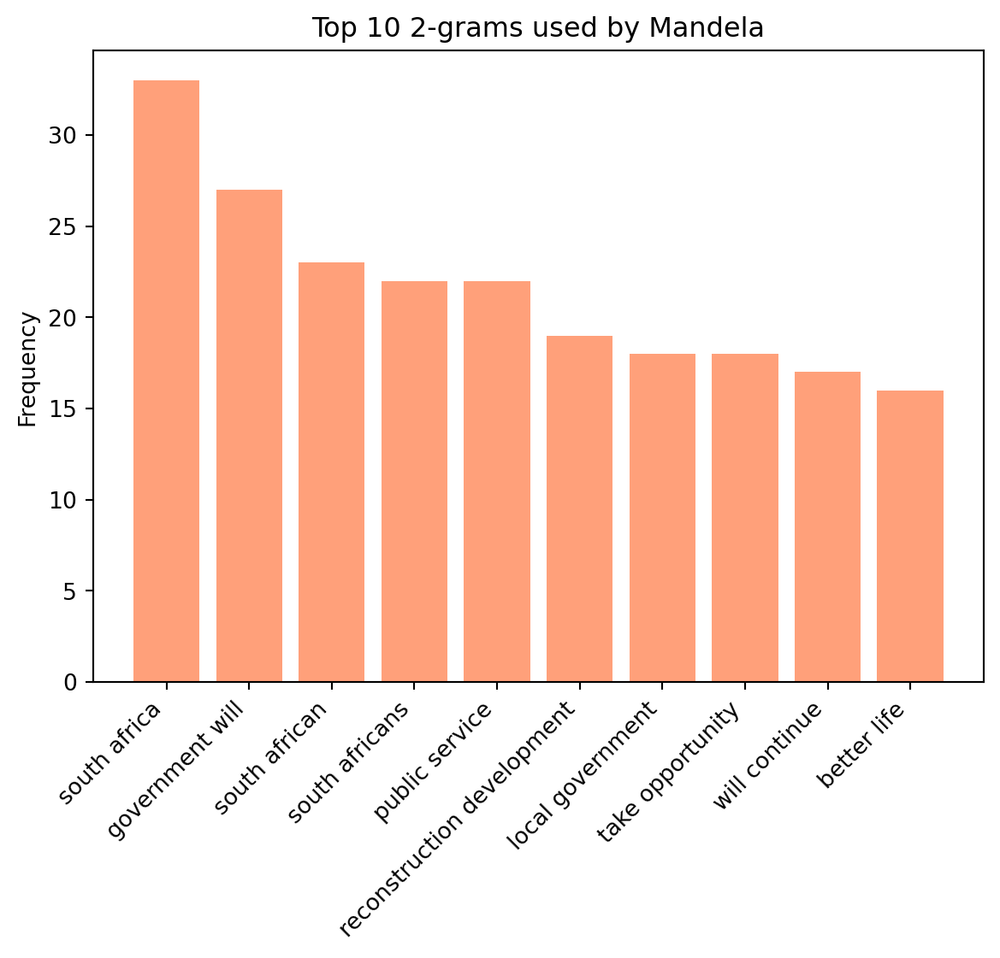

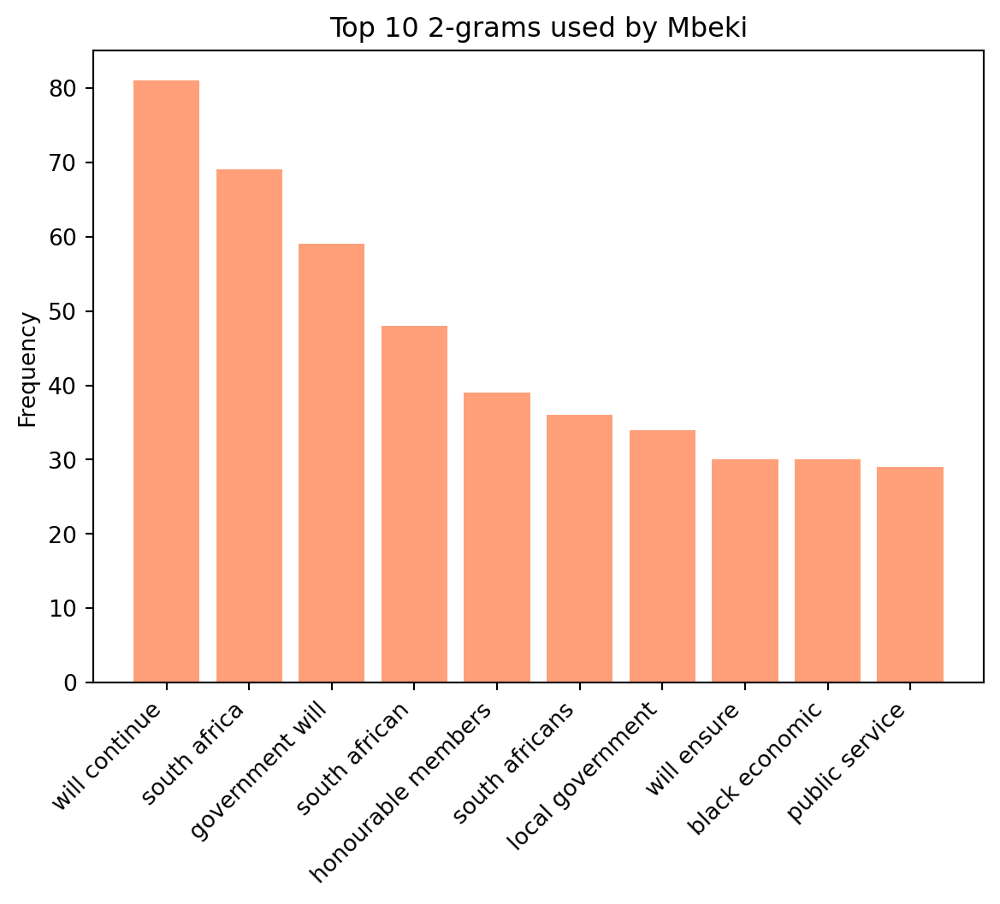

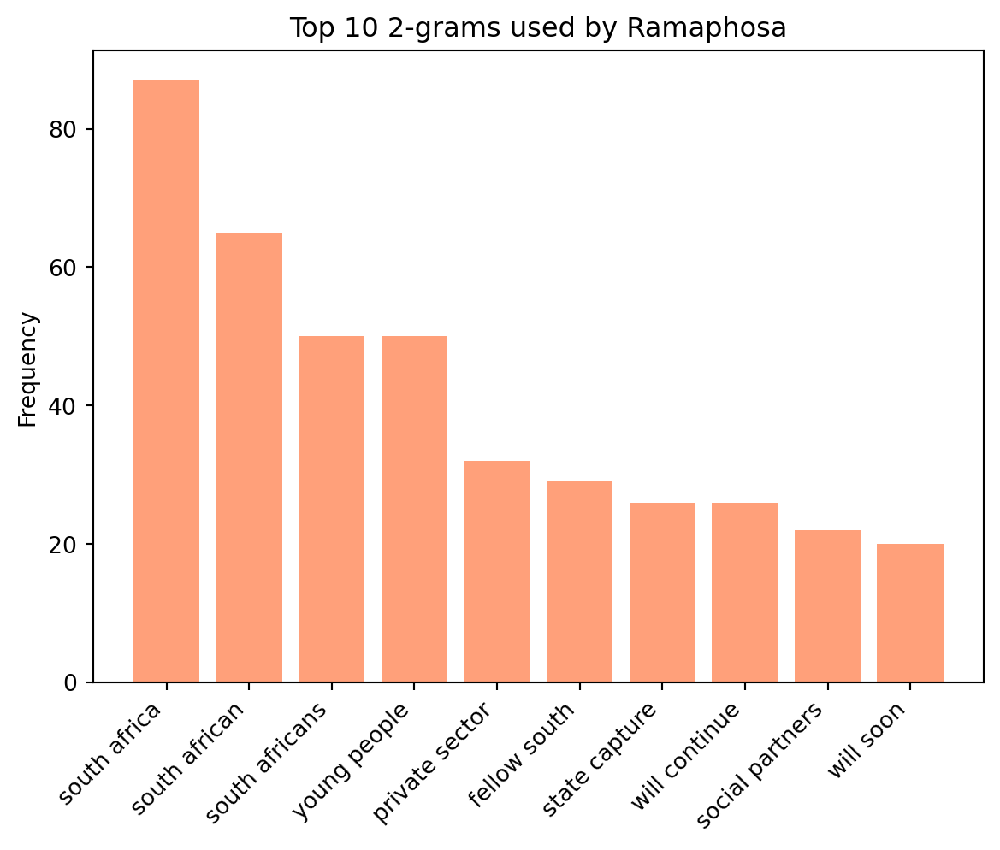

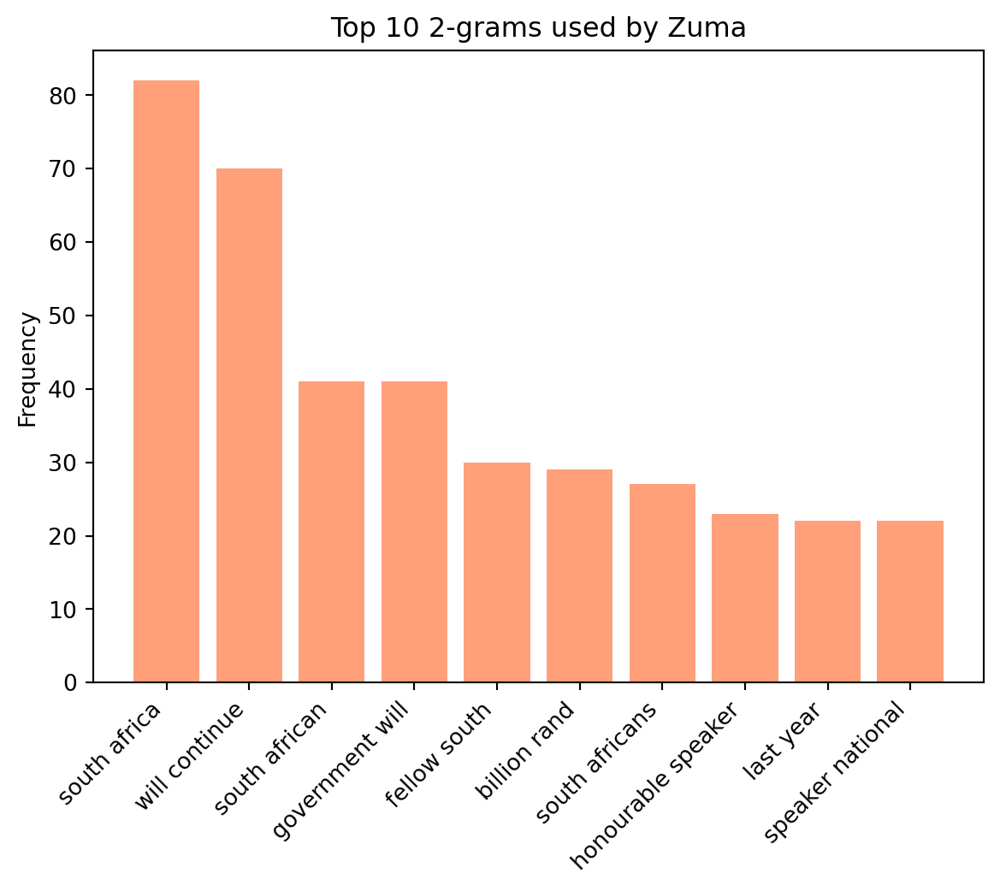

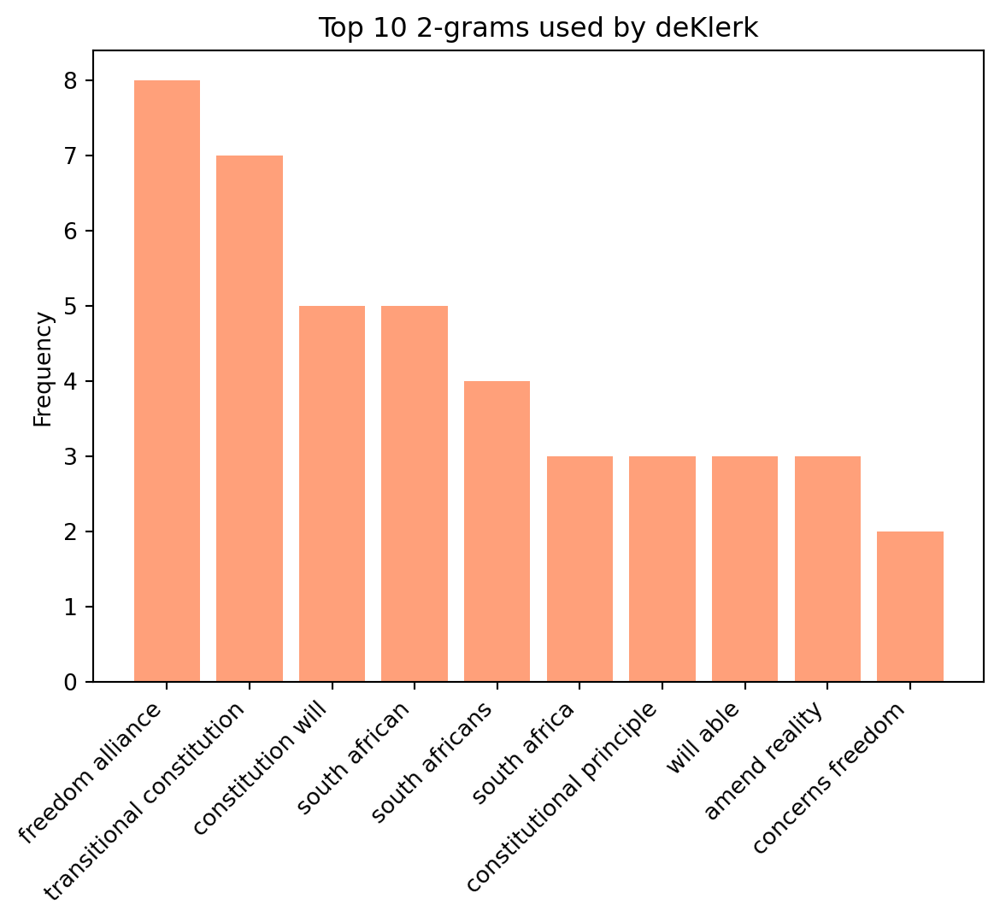

In [9]:
# Define a function to generate n-grams
def generate_ngrams(text, n):
    tokens = simple_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word not in stopwords]
    ngrams = zip(*[filtered_tokens[i:] for i in range(n)])
    return [" ".join(ngram) for ngram in ngrams]

# Define function to plot N-gram frequency
def plot_ngram_frequency(text, president_name, n=2, top_n=10):
    ngrams = generate_ngrams(text, n)
    frequency = Counter(ngrams)
    most_common = frequency.most_common(top_n)
    
    phrases, counts = zip(*most_common)
    plt.bar(phrases, counts, color='lightsalmon')
    plt.title(f"Top {top_n} {n}-grams used by {president_name}")
    plt.xticks(rotation=45, ha='right')
    plt.ylabel("Frequency")
    plt.show()

# Plot bigram frequency distribution for each president
for president, group in df_sentences.groupby('president'):
    plot_ngram_frequency(' '.join(group['sentence']), president)


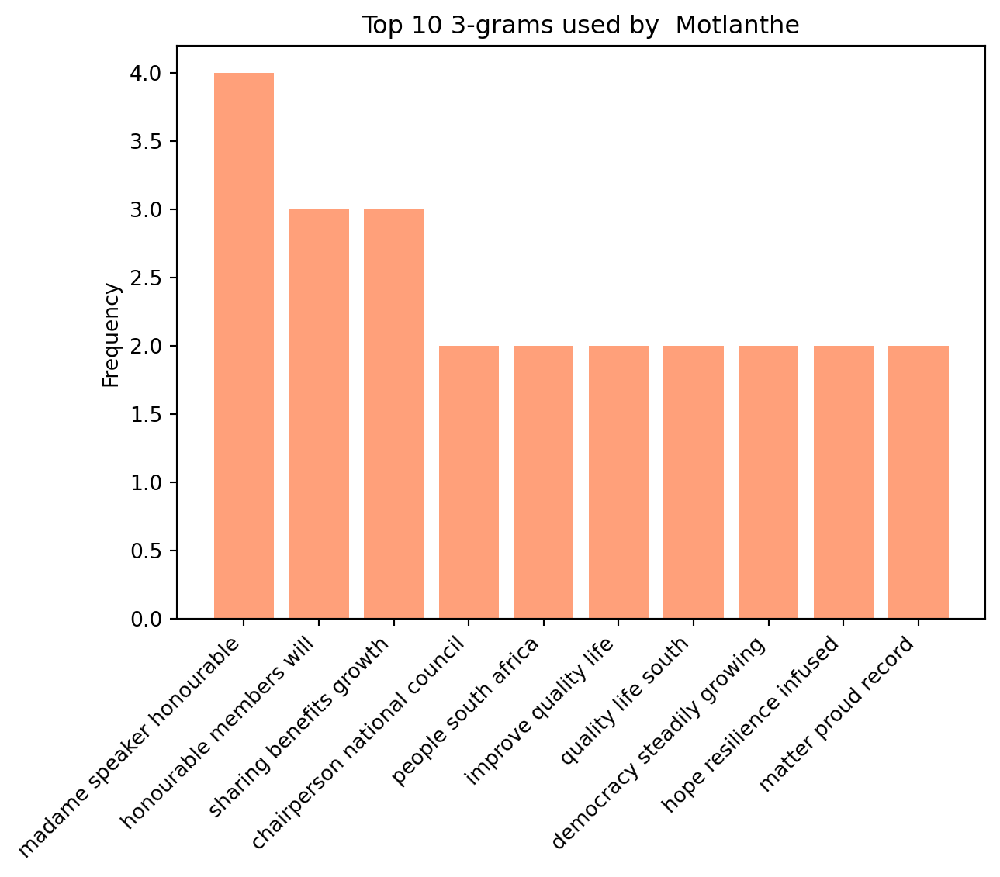

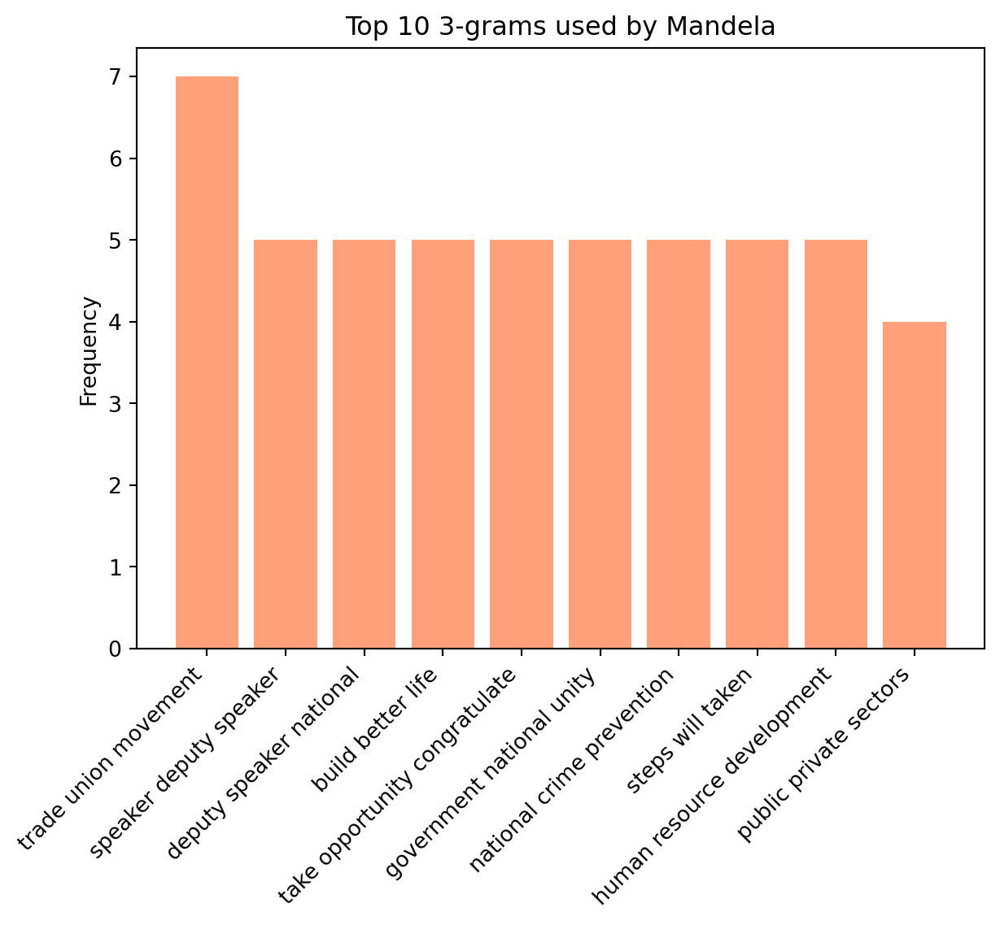

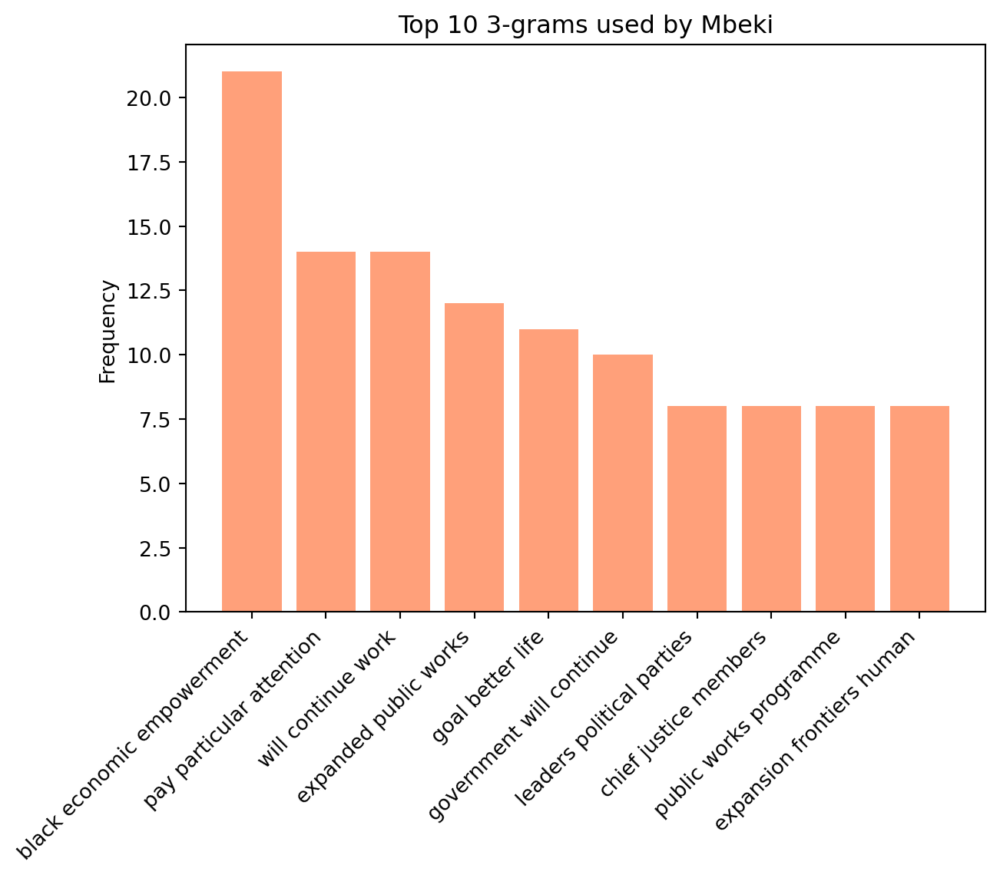

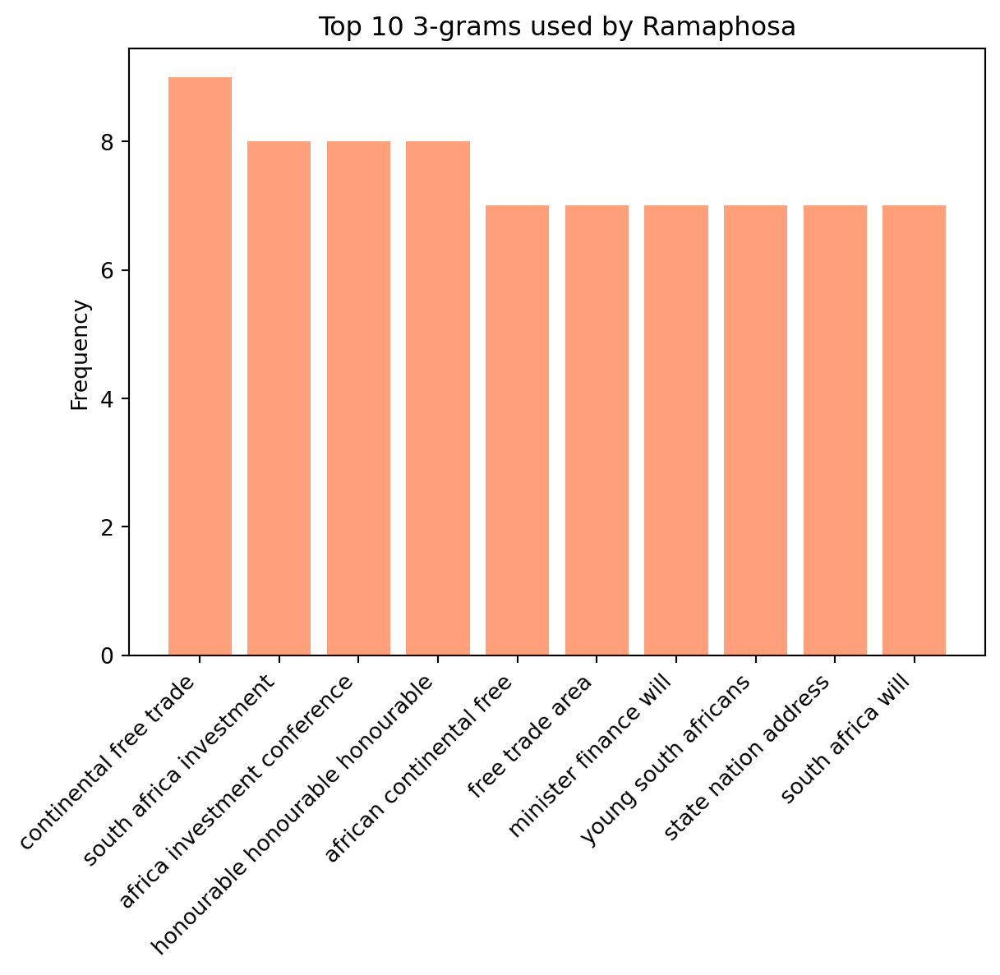

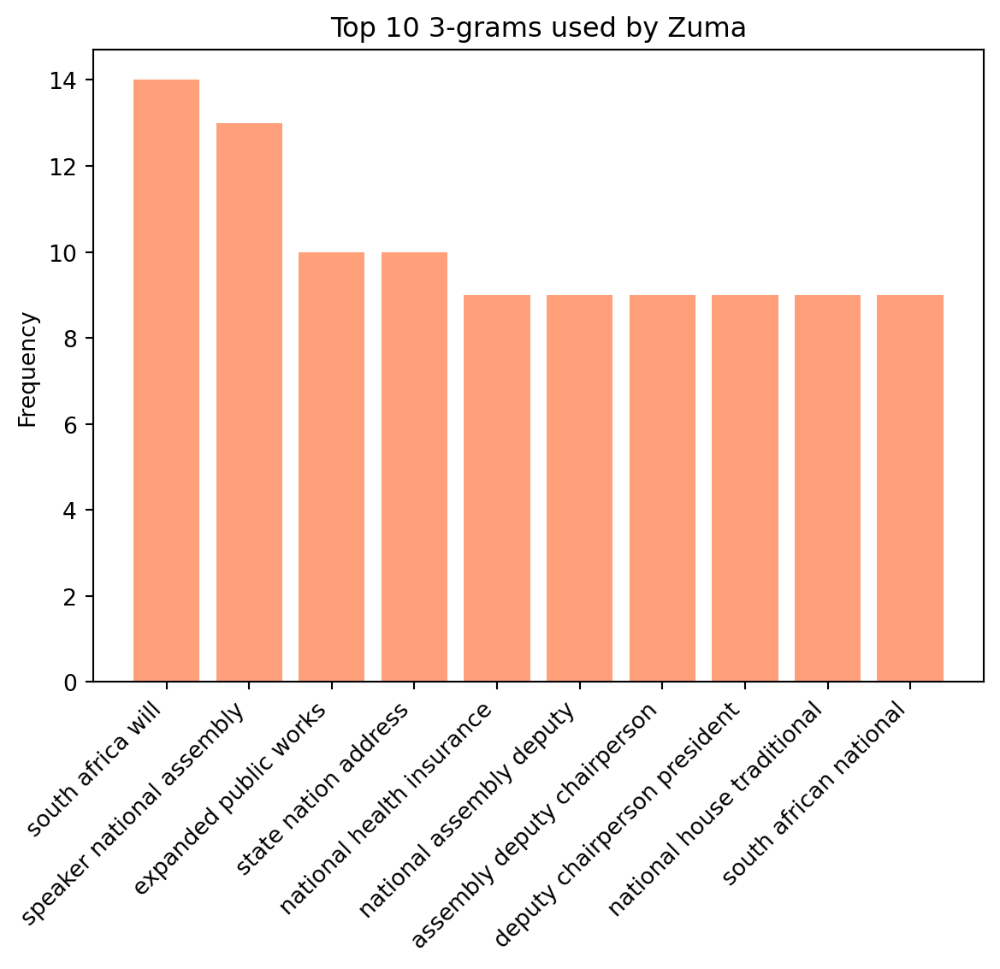

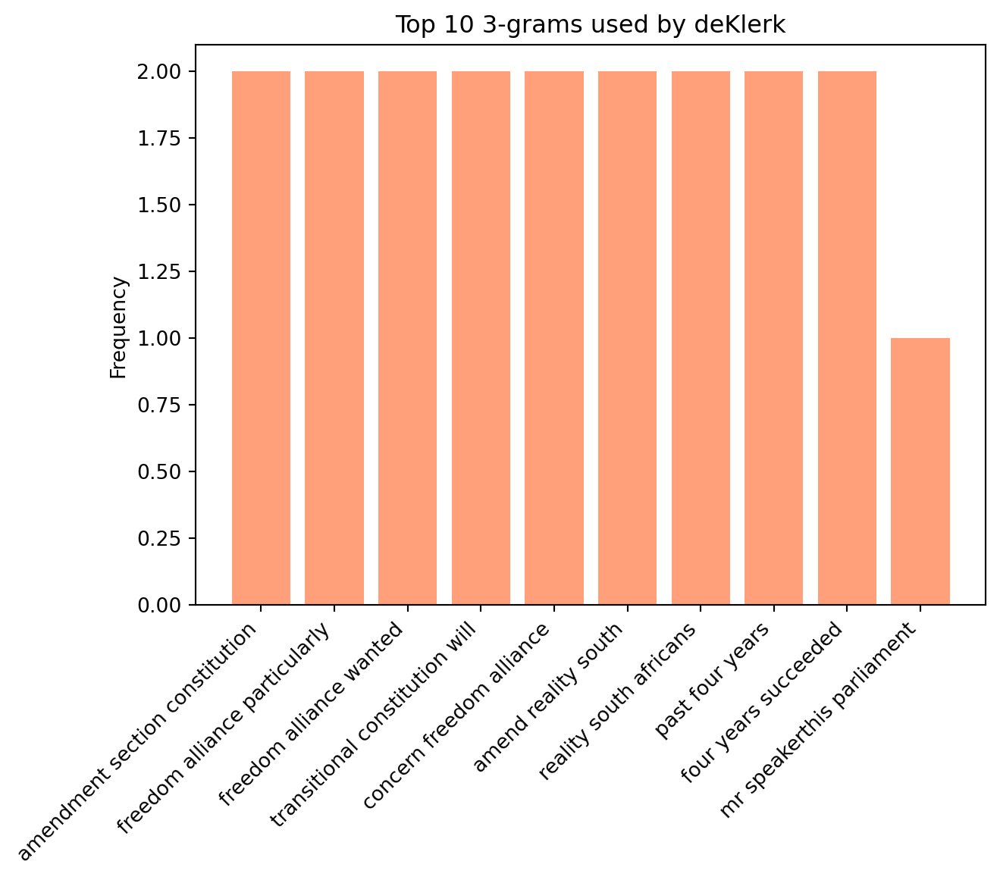

In [10]:
# Plot trigram frequency distribution for each president
for president, group in df_sentences.groupby('president'):
    plot_ngram_frequency(' '.join(group['sentence']), president, n=3)


In [11]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
from sklearn.feature_extraction.text import TfidfVectorizer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

def bow_x(data):
    # Extract relevant columns
    text_data = data['sentence']
    y = data['president']

    # Initialize a CountVectorizer for BOW representation
    vectorizer = CountVectorizer(lowercase=True, token_pattern=r"(?u)\b\w+\b", stop_words='english')

    # Fit and transform the text data
    X = vectorizer.fit_transform(text_data)

    # Create a DataFrame from the BOW representation
    bow_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

    return bow_df


def tf_idf(df):
    sentences = df['sentence'].tolist()

    # Create a TfidfVectorizer with stop words removal
    tfidf_vectorizer = TfidfVectorizer(stop_words='english')

    # Fit and transform the sentences to compute TF-IDF values
    tfidf_matrix = tfidf_vectorizer.fit_transform(sentences)

    # Create a new dataframe with TF-IDF values
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

    # Since we're not explicitly dropping any rows in the TF-IDF transformation,
    # the indices of tfidf_df should match the original dataframe.
    #indices = tfidf_df.index.tolist()

    return tfidf_df


def tokenize_text(text_data, labels, max_features=10000, maxlen=100):
    # Tokenization
    tokenizer = Tokenizer(num_words=max_features)
    tokenizer.fit_on_texts(text_data)
    sequences = tokenizer.texts_to_sequences(text_data)

    # Filter out sequences that have length 0
    seq_ok = [i for i, s in enumerate(sequences) if len(s) > 0]
    valid_labels = [labels.iloc[i] for i in seq_ok]

    # Padding sequences
    filtered_sequences = [sequences[i] for i in seq_ok]
    x_pad = pad_sequences(filtered_sequences, maxlen=maxlen)


    return x_pad, valid_labels, tokenizer

2023-10-15 10:52:26.417268: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


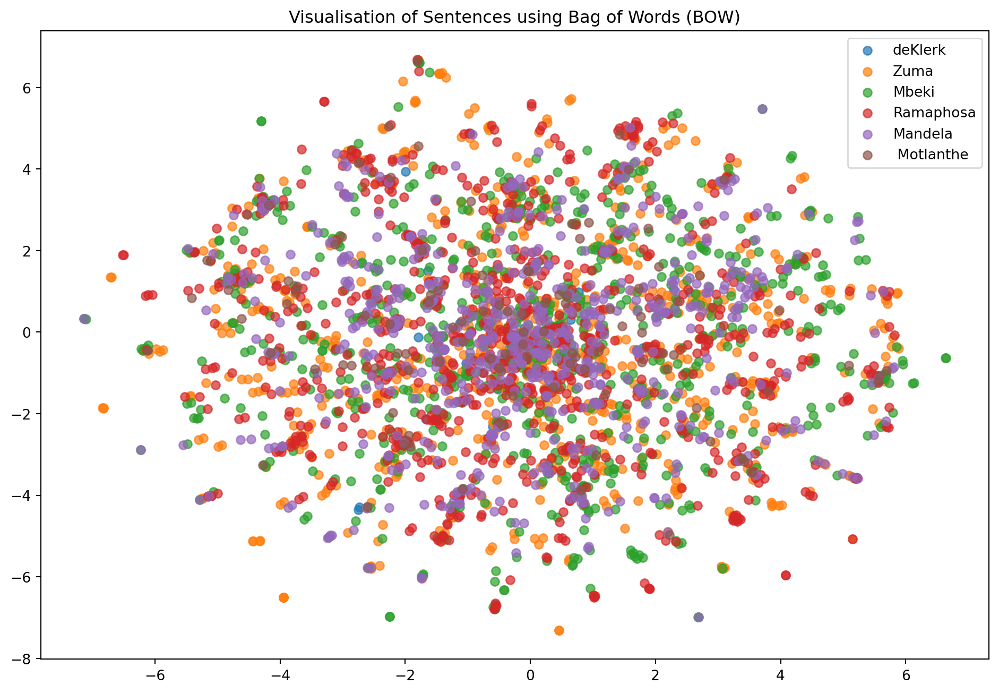

In [12]:
# Sample a subset of the data to alleviate memory issues
sample_df = df_sentences.sample(frac=0.4, random_state=1)

# 1. Encoding sentences using Bag of Words (BOW)
bow_encoded = bow_x(sample_df)
y_bow = sample_df['president']

# 2. Dimensionality reduction using t-SNE
tsne = TSNE(n_components=2, random_state=1)
bow_tsne = tsne.fit_transform(bow_encoded)

# 3. Visualise the results
plt.figure(figsize=(12, 8))
for president in sample_df['president'].unique():
    indices = [i for i, label in enumerate(y_bow) if label == president]
    plt.scatter(bow_tsne[indices, 0], bow_tsne[indices, 1], label=president, alpha=0.7)

plt.title('Visualisation of Sentences using Bag of Words (BOW)')
plt.legend()
plt.show()

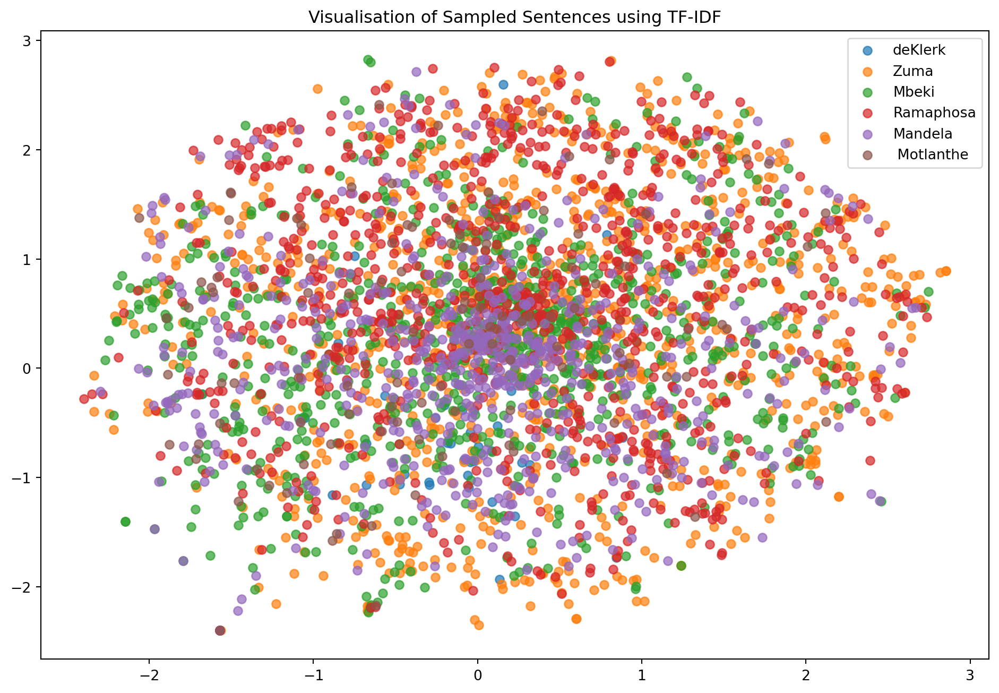

In [13]:
# Encoding sentences using TF-IDF for the sample data
tfidf_encoded_sample = tf_idf(sample_df)

# Dimensionality reduction using t-SNE for the TF-IDF encoded data
tfidf_tsne_sample = tsne.fit_transform(tfidf_encoded_sample)

# Visualise the results for the TF-IDF encoded sample data
plt.figure(figsize=(12, 8))
for president in sample_df['president'].unique():
    indices = [i for i, label in enumerate(sample_df['president']) if label == president]
    plt.scatter(tfidf_tsne_sample[indices, 0], tfidf_tsne_sample[indices, 1], label=president, alpha=0.7)

plt.title('Visualisation of Sampled Sentences using TF-IDF')
plt.legend()
plt.show()


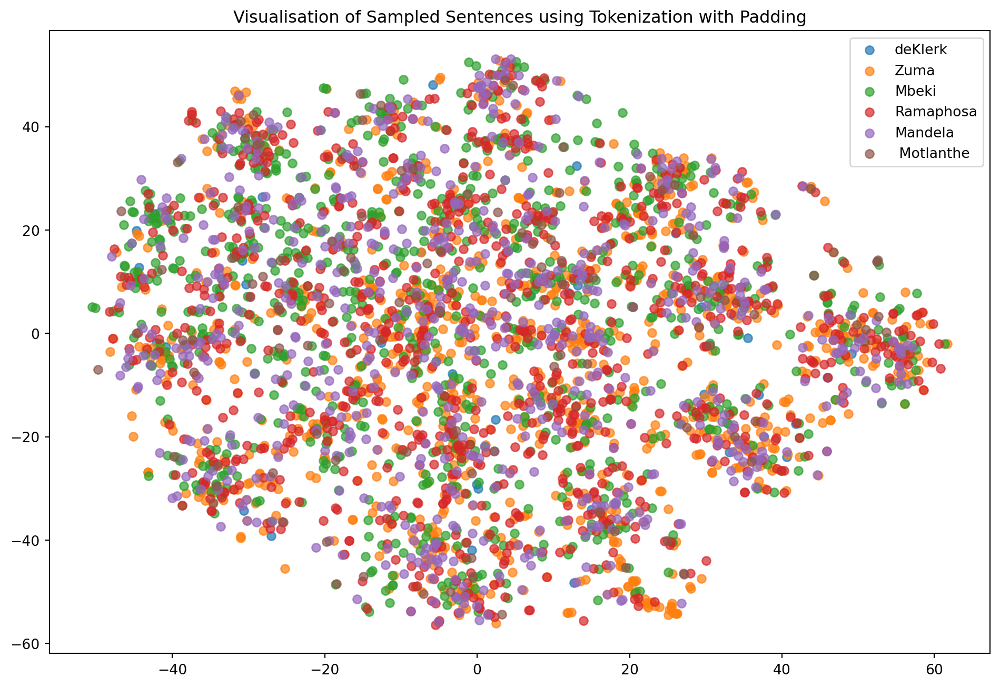

In [14]:
# Encoding sentences using Tokenization with Padding for the sample data
x_pad_sample, valid_labels_sample, _ = tokenize_text(sample_df['sentence'], sample_df['president'])

# Dimensionality reduction using t-SNE for the Tokenized data
tokenized_tsne_sample = tsne.fit_transform(x_pad_sample)

# Visualise the results for the Tokenized sample data
plt.figure(figsize=(12, 8))
for president in sample_df['president'].unique():
    indices = [i for i, label in enumerate(valid_labels_sample) if label == president]
    plt.scatter(tokenized_tsne_sample[indices, 0], tokenized_tsne_sample[indices, 1], label=president, alpha=0.7)

plt.title('Visualisation of Sampled Sentences using Tokenization with Padding')
plt.legend()
plt.show()